In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import dandelion as ddl
sc.logging.print_header()

warnings.filterwarnings('ignore')
os.chdir('/lustre/scratch117/cellgen/team297/kt16/Ziad/scanpy')

scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.18.5 scipy==1.4.1 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.7.1 leidenalg==0.8.2


In [2]:
# Set up the sample info
sampleInfo = pd.read_csv('../Sample_Key.csv')
sampleInfo['10x_ID'] = ['Sample_Fq'+str(x) for x in sampleInfo['10x_ID']]

In [3]:
# read it as a list
adata_list = []
# for i in range(0, len(sampleInfo['10x_ID'])):
for i in sampleInfo.index:            
    # import data    
    inputfile='../raw/Trans/'+sampleInfo['10x_ID'].at[i]+'/adata_soupx_trans_cite.h5ad'
    adata = sc.read_h5ad(inputfile)
    adata.var_names_make_unique()
    adata.obs['sampleid'] = sampleInfo['10x_ID'].at[i]
    adata.obs['sampleid_study'] = sampleInfo['Sample ID'].at[i]
    adata.obs['timepoint'] = sampleInfo['Timepoint'].at[i]
    adata.obs['treatment'] = sampleInfo['Treatment'].at[i]
    # rename cells to sample id + barcode, cleaving the trailing -1
    adata.obs_names = [str(sampleInfo['10x_ID'].at[i])+'_'+str(j).split('-')[0] for j in adata.obs_names]
    as_list = adata.var.index.tolist()
    idx = as_list.index('CD25+prot')
    as_list[idx] = 'CD25_prot'
    adata.var.index = as_list
    adata.var.loc['CD25_prot']['gene_ids'] = 'CD25_prot'
    adata.obs['study_id'] = [x.split('T')[0] for x in adata.obs['sampleid_study']]
    adata.layers['counts'] = adata.X.copy()
    rna = adata[:, adata.var["feature_types"] == "Gene Expression"].copy()
    # using dandelion's qc recipe to mark doublets with scrublet and low quality cells based on standard metrics
    # default settings are max_genes=2500, min_genes=200, mito_cutoff=0.05, pval_cutoff=0.1, min_counts=None, max_counts=None
    ddl.pp.recipe_scanpy_qc(rna, mito_cutoff = 10, max_genes = 6000)
    adata.obs = rna.obs.copy()    
    adata_list.append(adata)
adata = adata_list[0].concatenate(adata_list[1:], index_unique=None)
adata

AnnData object with n_obs × n_vars = 235949 × 33548
    obs: 'sampleid', 'sampleid_study', 'timepoint', 'treatment', 'study_id', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'is_doublet', 'filter_rna', 'batch'
    var: 'gene_ids', 'feature_types'
    layers: 'counts'

In [4]:
adata.var["feature_types"].value_counts()

Gene Expression     33538
Antibody Capture       10
Name: feature_types, dtype: int64

... storing 'sampleid' as categorical
... storing 'sampleid_study' as categorical
... storing 'timepoint' as categorical
... storing 'treatment' as categorical
... storing 'study_id' as categorical


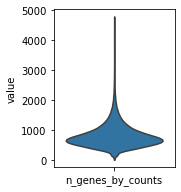

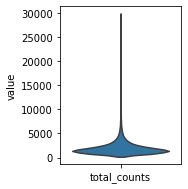

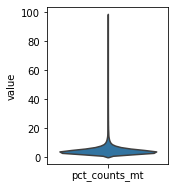

In [5]:
# violin plot of the computed quality measures.
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
# sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True, size = 0)
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (3,3)
sc.pl.violin(adata, ['n_genes_by_counts'], size = 0)
sc.pl.violin(adata, ['total_counts'], size = 0)
sc.pl.violin(adata, ['pct_counts_mt'], size = 0)
plt.rcParams['figure.figsize'] = (6, 4)

In [6]:
# split to RNA
rna = adata[:, adata.var["feature_types"] == "Gene Expression"].copy()
rna

AnnData object with n_obs × n_vars = 235949 × 33538
    obs: 'sampleid', 'sampleid_study', 'timepoint', 'treatment', 'study_id', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'is_doublet', 'filter_rna', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

In [7]:
# How many doublets did scrublet pick up?
rna.obs['is_doublet'].value_counts()

False    222525
True      13424
Name: is_doublet, dtype: int64

In [8]:
# How many cells are `bad quality`
rna.obs['filter_rna'].value_counts()

False    208750
True      27199
Name: filter_rna, dtype: int64

In [9]:
# Remove the bad quality cells and continue
rna = rna[rna.obs['filter_rna'] != True].copy()
rna

AnnData object with n_obs × n_vars = 208750 × 33538
    obs: 'sampleid', 'sampleid_study', 'timepoint', 'treatment', 'study_id', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'is_doublet', 'filter_rna', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

In [10]:
# Also read in the alternate version of the files
adata_list = []
# for i in range(0, len(sampleInfo['10x_ID'])):
for i in sampleInfo.index:            
    # import data
    inputfile='../raw/Trans/'+sampleInfo['10x_ID'].at[i]+'/adata_soupx_trans.h5ad'
    adata_ = sc.read_h5ad(inputfile)
    adata_.var_names_make_unique()
    adata_.obs_names = [str(sampleInfo['10x_ID'].at[i])+'_'+str(j).split('-')[0] for j in adata_.obs_names]
    as_list = adata_.var.index.tolist()
    idx = as_list.index('CD25+prot')
    as_list[idx] = 'CD25_prot'
    adata_.var.index = as_list
    adata_.var.loc['CD25_prot']['gene_ids'] = 'CD25_prot'
    adata_list.append(adata_)
adata2 = adata_list[0].concatenate(adata_list[1:], index_unique=None)

adata_list = []
# for i in range(0, len(sampleInfo['10x_ID'])):
for i in sampleInfo.index:            
    # import data
    inputfile='../raw/Trans/'+sampleInfo['10x_ID'].at[i]+'/adata_soupx_trans_cite_bgshift.h5ad'
    adata_ = sc.read_h5ad(inputfile)
    adata_.var_names_make_unique()
    adata_.obs_names = [str(sampleInfo['10x_ID'].at[i])+'_'+str(j).split('-')[0] for j in adata_.obs_names]
    as_list = adata_.var.index.tolist()
    idx = as_list.index('CD25+prot')
    as_list[idx] = 'CD25_prot'
    adata_.var.index = as_list
    adata_.var.loc['CD25_prot']['gene_ids'] = 'CD25_prot'    
    adata_list.append(adata_)
adata3 = adata_list[0].concatenate(adata_list[1:], index_unique=None)

In [11]:
adata2.obs = adata.obs.copy()
adata3.obs = adata.obs.copy()

In [12]:
adata

AnnData object with n_obs × n_vars = 235949 × 33548
    obs: 'sampleid', 'sampleid_study', 'timepoint', 'treatment', 'study_id', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'is_doublet', 'filter_rna', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

In [13]:
# do the same for adata as well
adata = adata[adata.obs['filter_rna'] != True].copy()
adata

AnnData object with n_obs × n_vars = 208750 × 33548
    obs: 'sampleid', 'sampleid_study', 'timepoint', 'treatment', 'study_id', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'is_doublet', 'filter_rna', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

In [14]:
adata2 = adata2[adata2.obs['filter_rna'] != True].copy()
adata3 = adata3[adata3.obs['filter_rna'] != True].copy()

### RNA

In [15]:
# filter genes
sc.pp.filter_genes(rna, min_cells = 3)

In [16]:
# normalize to 10000 counts per cell
sc.pp.normalize_total(rna, target_sum = 1e4)
sc.pp.log1p(rna)

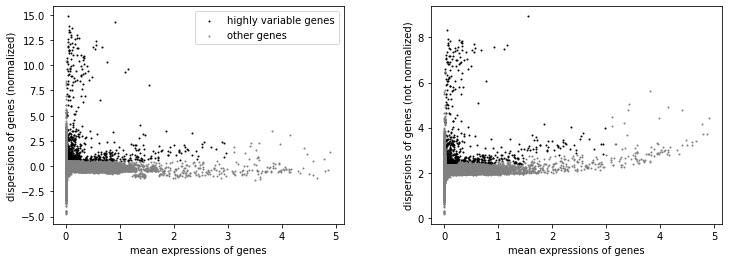

In [17]:
# Identify highly-variable genes
sc.pp.highly_variable_genes(rna, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# plot highly_variable_genes
sc.pl.highly_variable_genes(rna)

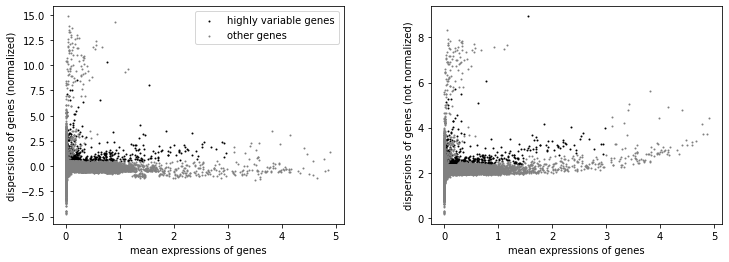

In [18]:
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rna.var.index:
    if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
        rna.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(rna)

In [19]:
# stash the normalized data in raw
rna.raw = rna

In [20]:
# filter to only highly variable
rna = rna[:, rna.var['highly_variable']]
rna

View of AnnData object with n_obs × n_vars = 208750 × 846
    obs: 'sampleid', 'sampleid_study', 'timepoint', 'treatment', 'study_id', 'scrublet_score', 'n_genes', 'percent_mito', 'n_counts', 'is_doublet', 'filter_rna', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [21]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rna, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rna, max_value = 10)
sc.tl.pca(rna, svd_solver = 'arpack')

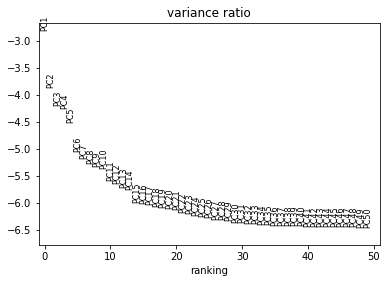

In [22]:
# Principal component analysis
sc.pl.pca_variance_ratio(rna, log = True, n_pcs = 50)

In [23]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rna, key='study_id')

2021-01-21 20:07:09,908 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 20:09:12,701 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 20:11:10,583 - harmonypy - INFO - Iteration 3 of 10
2021-01-21 20:13:03,342 - harmonypy - INFO - Iteration 4 of 10
2021-01-21 20:15:00,969 - harmonypy - INFO - Iteration 5 of 10
2021-01-21 20:15:39,583 - harmonypy - INFO - Iteration 6 of 10
2021-01-21 20:16:24,297 - harmonypy - INFO - Iteration 7 of 10
2021-01-21 20:18:23,173 - harmonypy - INFO - Iteration 8 of 10
2021-01-21 20:19:12,445 - harmonypy - INFO - Converged after 8 iterations


In [24]:
sc.pp.neighbors(rna, use_rep = 'X_pca_harmony')

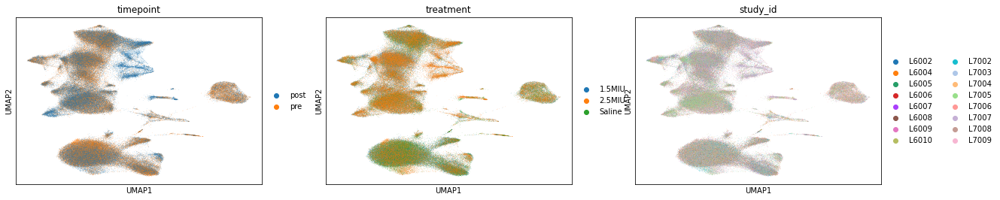

In [25]:
# run UMAP
sc.tl.umap(rna, min_dist = .3)
sc.pl.umap(rna, color=['timepoint', 'treatment', 'study_id'])

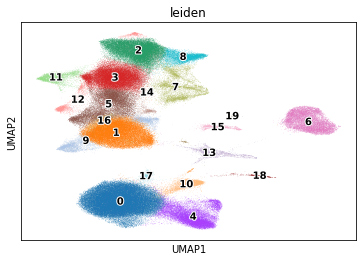

In [26]:
# find clusters
sc.tl.leiden(rna)
sc.pl.umap(rna, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

In [27]:
# update the raw slots
adata.obsm = rna.obsm.copy()
adata.obs = rna.obs.copy()
adata.obsp = rna.obsp.copy()
# update the other adata raw slots
adata2.obsm = adata.obsm.copy()
adata2.obs = adata.obs.copy()
adata2.obsp = adata.obsp.copy()
adata3.obsm = adata.obsm.copy()
adata3.obs = adata.obs.copy()
adata3.obsp = adata.obsp.copy()

In [28]:
# save first
rna.write('h5ad/adata_soupx_trans_cite_rna.h5ad', compression = 'gzip')
adata.write('h5ad/adata_soupx_trans_cite_raw.h5ad', compression = 'gzip')
adata2.write('h5ad/adata_soupx_trans_raw.h5ad', compression = 'gzip')
adata3.write('h5ad/adata_soupx_trans_cite_bgshift_raw.h5ad', compression = 'gzip')

In [29]:
# quick marker gene test
sc.tl.rank_genes_groups(rna, groupby = 'leiden')

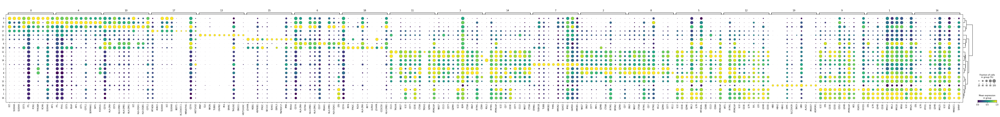

In [30]:
sc.tl.dendrogram(rna, groupby = 'leiden')
sc.pl.rank_genes_groups_dotplot(rna, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import os
import warnings
import functools
import seaborn as sns
import scipy.stats
import anndata
import dandelion as ddl
sc.logging.print_header()

warnings.filterwarnings('ignore')
os.chdir('/lustre/scratch117/cellgen/team297/kt16/Ziad/scanpy')

scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.18.5 scipy==1.4.1 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.7.1 leidenalg==0.8.2


In [2]:
rna = sc.read_h5ad('h5ad/adata_soupx_trans_cite_rna.h5ad')
adata = sc.read_h5ad('h5ad/adata_soupx_trans_cite_raw.h5ad')
adata2 = sc.read_h5ad('h5ad/adata_soupx_trans_raw.h5ad')
adata3 = sc.read_h5ad('h5ad/adata_soupx_trans_cite_bgshift_raw.h5ad')

In [3]:
newdict = {'0':'MNP',
'1':'T',
'2':'NK',
'3':'T',
'4':'MNP',
'5':'T',
'6':'B',
'7':'Proliferating',
'8':'NK',
'9':'T',
'10':'MNP',
'11':'gdT',
'12':'T/NK',
'13':'Megakaryocyte',
'14':'T',
'15':'Plasmablast',
'16':'T',
'17':'MNP',
'18':'pDC',
'19':'Erythrocyte'}
rna.obs['initial_clustering'] = [newdict[l] for l in rna.obs['leiden']]
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

... storing 'initial_clustering' as categorical


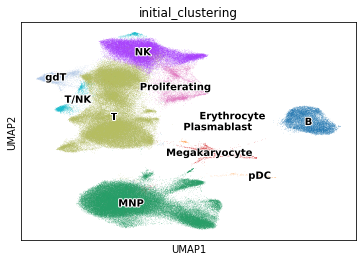

In [4]:
sc.pl.umap(rna, color=['initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

## Manually inspect for doublets for each major celltype

## MNP

In [5]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['MNP'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [6]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

In [7]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')

2021-01-21 21:08:01,073 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 21:08:31,826 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 21:09:03,254 - harmonypy - INFO - Iteration 3 of 10
2021-01-21 21:09:32,885 - harmonypy - INFO - Converged after 3 iterations


In [8]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

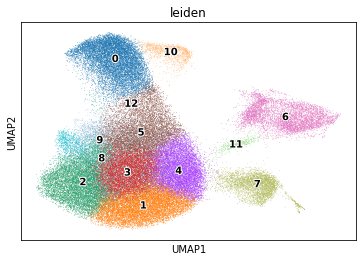

In [9]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

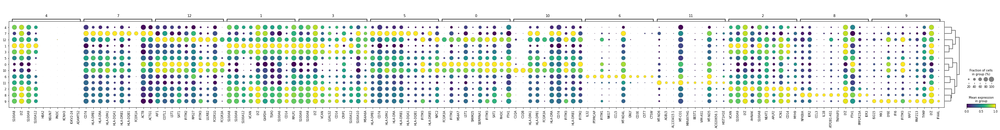

In [10]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=.58)

In [11]:
newdict = {'0':'MNP',
'1':'MNP',
'2':'MNP',
'3':'MNP',
'4':'MNP',
'5':'MNP',
'6':'doublets',
'7':'MNP',
'8':'MNP',
'9':'MNP',
'10':'MNP',
'11':'doublets',
'12':'MNP'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [12]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['MNP'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [13]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [14]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')

2021-01-21 21:15:06,043 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 21:15:32,321 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 21:16:00,685 - harmonypy - INFO - Converged after 2 iterations


In [15]:
# run UMAP
sc.tl.umap(rnax, min_dist=0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

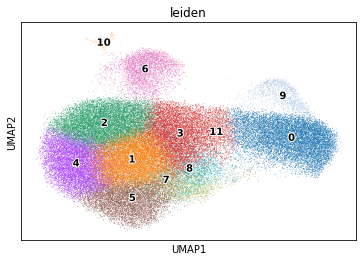

In [16]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

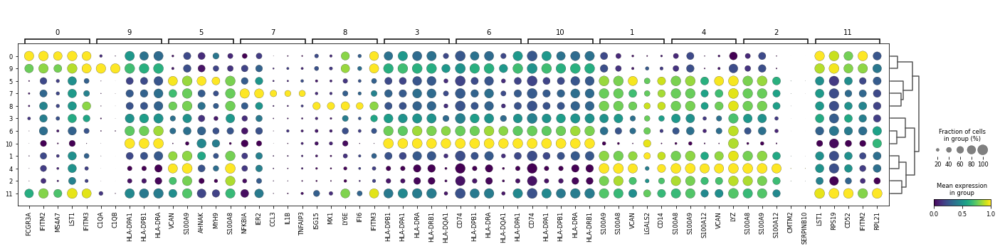

In [17]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 5, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

Looks ok to me. so next cell type.

## pDC

In [18]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['pDC'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [19]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [20]:
# run harmony. compute the neighborhood graph.
# sc.external.pp.harmony_integrate(rnax, key='study_id')
# sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
sc.pp.neighbors(rnax)

In [21]:
# run UMAP
sc.tl.umap(rnax, min_dist=0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

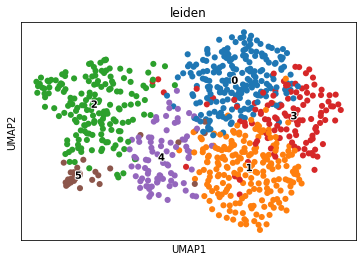

In [22]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

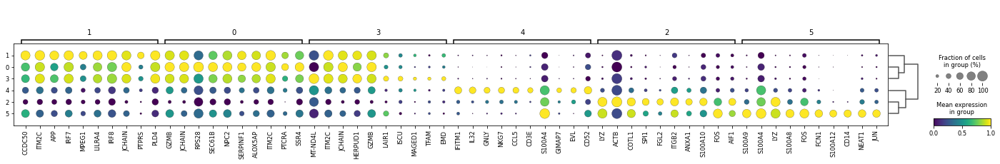

In [23]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

In [24]:
newdict = {'0':'pDC',
'1':'pDC',
'2':'doublets',
'3':'pDC',
'4':'doublets',
'5':'doublets'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [25]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['pDC'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [26]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [27]:
# run harmony. compute the neighborhood graph.
# sc.external.pp.harmony_integrate(rnax, key='study_id')
# sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
sc.pp.neighbors(rnax)

In [29]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

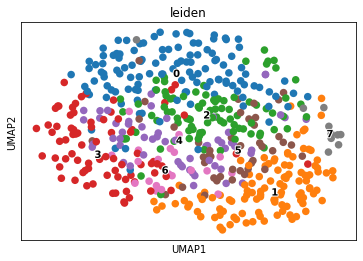

In [30]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

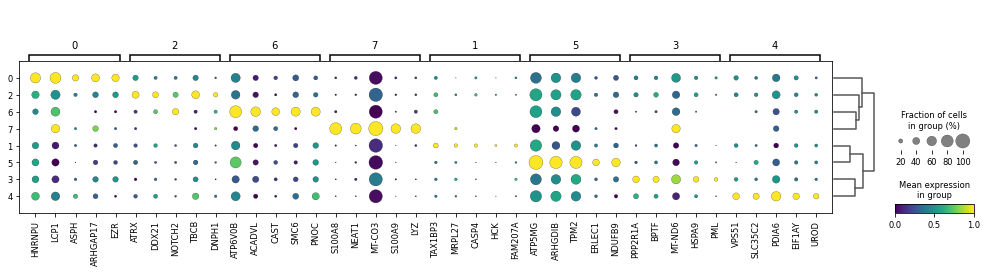

In [31]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 5, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

In [32]:
newdict = {'0':'pDC',
'1':'pDC',
'2':'pDC',
'3':'pDC',
'4':'pDC',
'5':'pDC',
'6':'pDC',
'7':'doublets',}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

Looks ok to me. so next cell type.

## Megakaryocyte

In [33]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['Megakaryocyte'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [34]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [35]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 21:23:10,949 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 21:23:11,632 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 21:23:12,226 - harmonypy - INFO - Iteration 3 of 10
2021-01-21 21:23:12,792 - harmonypy - INFO - Iteration 4 of 10
2021-01-21 21:23:13,113 - harmonypy - INFO - Iteration 5 of 10
2021-01-21 21:23:13,414 - harmonypy - INFO - Iteration 6 of 10
2021-01-21 21:23:13,687 - harmonypy - INFO - Iteration 7 of 10
2021-01-21 21:23:13,915 - harmonypy - INFO - Iteration 8 of 10
2021-01-21 21:23:14,167 - harmonypy - INFO - Iteration 9 of 10
2021-01-21 21:23:14,421 - harmonypy - INFO - Iteration 10 of 10
2021-01-21 21:23:14,674 - harmonypy - INFO - Stopped before convergence


In [36]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

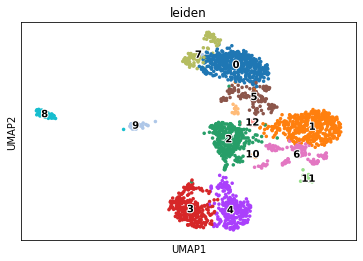

In [37]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

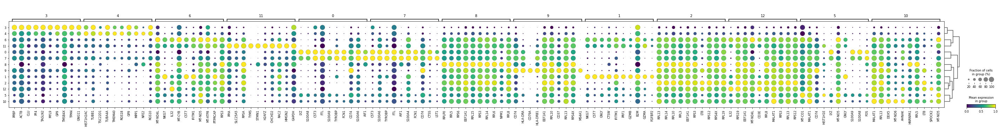

In [38]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

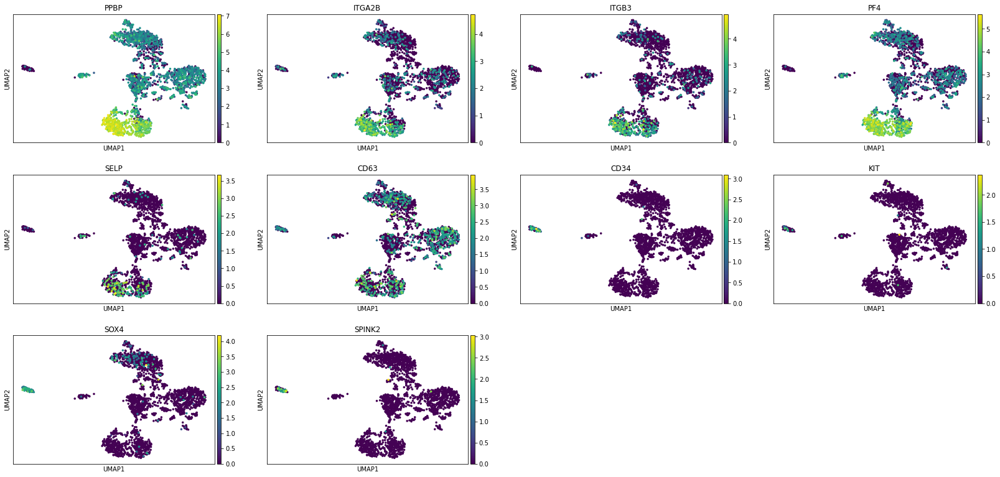

In [39]:
sc.pl.umap(rnax, color=['PPBP', 'ITGA2B', 'ITGB3', 'PF4', 'SELP', 'CD63', 'CD34', 'KIT', 'SOX4', 'SPINK2'])

In [40]:
newdict = {'0':'doublets',
'1':'doublets',
'2':'doublets',
'3':'Megakaryocyte',
'4':'Megakaryocyte',
'5':'doublets',
'6':'doublets',
'7':'doublets',
'8':'HSC',
'9':'doublets',
'10':'doublets',
'11':'doublets',
'12':'doublets'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [41]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['Megakaryocyte'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [42]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [43]:
# run harmony. compute the neighborhood graph.
# sc.external.pp.harmony_integrate(rnax, key='study_id')
# sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
sc.pp.neighbors(rnax)

In [44]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

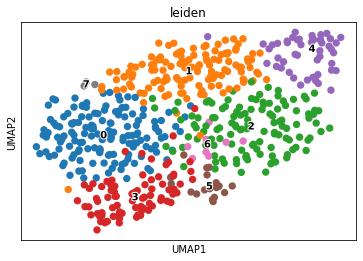

In [45]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

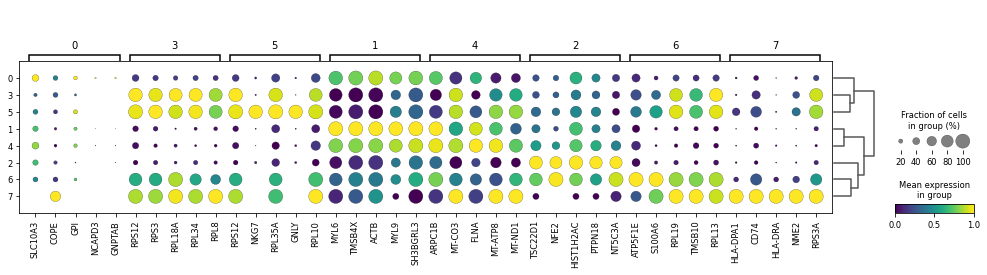

In [46]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 5, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

Looks ok to me. so next cell type.

## Erythrocyte

In [47]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['Erythrocyte'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [48]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [49]:
# run harmony. compute the neighborhood graph.
# sc.external.pp.harmony_integrate(rnax, key='study_id')
# sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
sc.pp.neighbors(rnax)

In [50]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

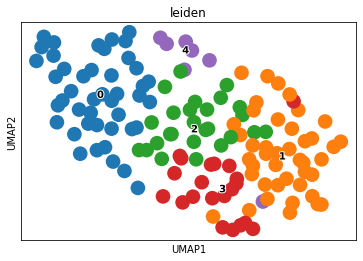

In [51]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

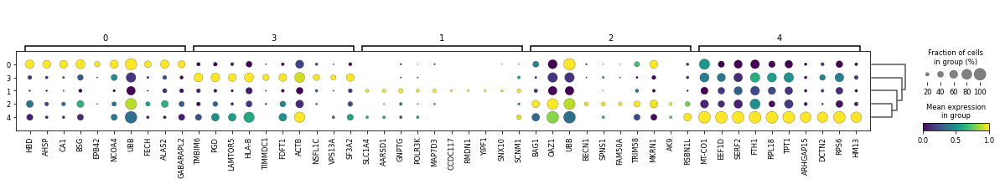

In [52]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

Looks ok to me. so next cell type.

## B and Plasmablast

In [53]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['B', 'Plasmablast'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rnax.var.index:
    if re.search('^IG[HKL][VDJC]', i):
        rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [54]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [55]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 21:28:18,045 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 21:28:22,417 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 21:28:26,605 - harmonypy - INFO - Iteration 3 of 10
2021-01-21 21:28:30,091 - harmonypy - INFO - Iteration 4 of 10
2021-01-21 21:28:32,238 - harmonypy - INFO - Iteration 5 of 10
2021-01-21 21:28:34,474 - harmonypy - INFO - Iteration 6 of 10
2021-01-21 21:28:36,496 - harmonypy - INFO - Iteration 7 of 10
2021-01-21 21:28:38,587 - harmonypy - INFO - Iteration 8 of 10
2021-01-21 21:28:43,039 - harmonypy - INFO - Iteration 9 of 10
2021-01-21 21:28:45,063 - harmonypy - INFO - Converged after 9 iterations


In [56]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

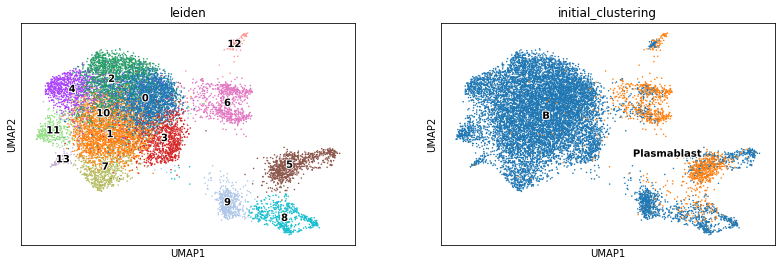

In [57]:
sc.pl.umap(rnax, color=['leiden', 'initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

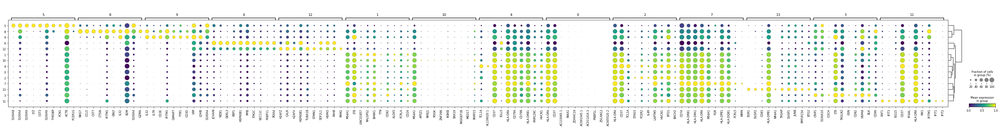

In [58]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=.58)

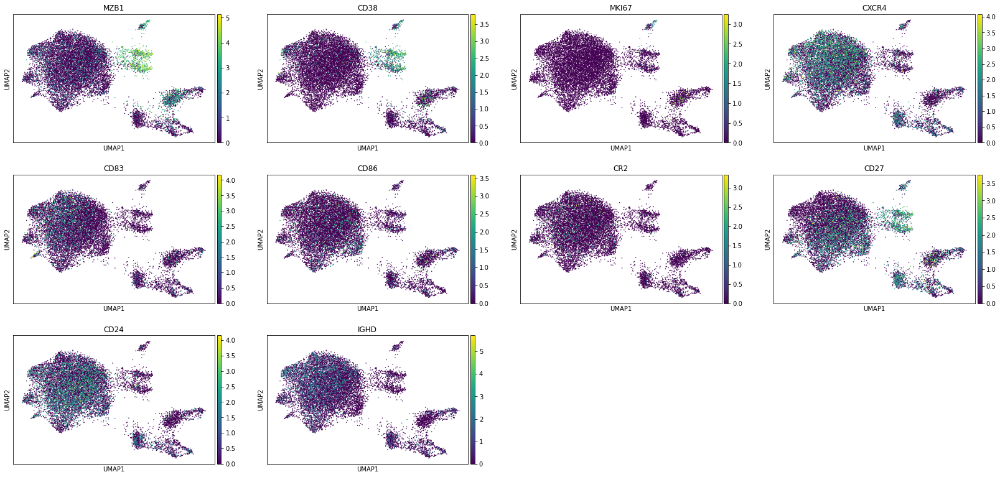

In [63]:
sc.pl.umap(rnax, color = ['MZB1', 'CD38', 'MKI67', 'CXCR4', 'CD83', 'CD86', 'CR2', 'CD27', 'CD24', 'IGHD'])

In [64]:
newdict = {'0':'B',
'1':'B',
'2':'B',
'3':'B',
'4':'B',
'5':'doublets',
'6':'Plasmablast',
'7':'B',
'8':'doublets',
'9':'doublets',
'10':'B',
'11':'B',
'12':'Plasmablast',
'13':'B'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [65]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['B', 'Plasmablast'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rnax.var.index:
    if re.search('^IG[HKL][VDJC]', i):
        rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [66]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [67]:
# run harmony. 
sc.external.pp.harmony_integrate(rnax, key='study_id')
# compute the neighborhood graph.
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 21:35:58,804 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 21:36:02,149 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 21:36:05,432 - harmonypy - INFO - Iteration 3 of 10
2021-01-21 21:36:07,724 - harmonypy - INFO - Iteration 4 of 10
2021-01-21 21:36:09,487 - harmonypy - INFO - Iteration 5 of 10
2021-01-21 21:36:11,133 - harmonypy - INFO - Iteration 6 of 10
2021-01-21 21:36:12,600 - harmonypy - INFO - Iteration 7 of 10
2021-01-21 21:36:14,130 - harmonypy - INFO - Iteration 8 of 10
2021-01-21 21:36:15,654 - harmonypy - INFO - Iteration 9 of 10
2021-01-21 21:36:17,053 - harmonypy - INFO - Converged after 9 iterations


In [68]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)

In [69]:
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

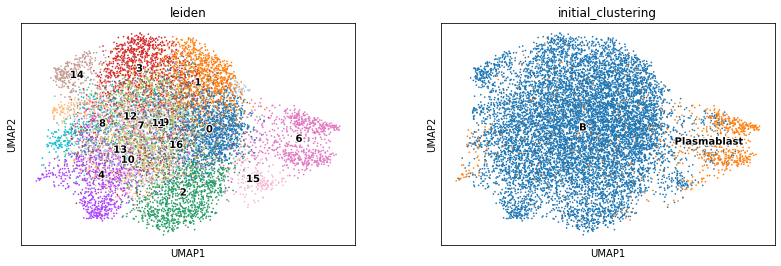

In [70]:
sc.pl.umap(rnax, color=['leiden', 'initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

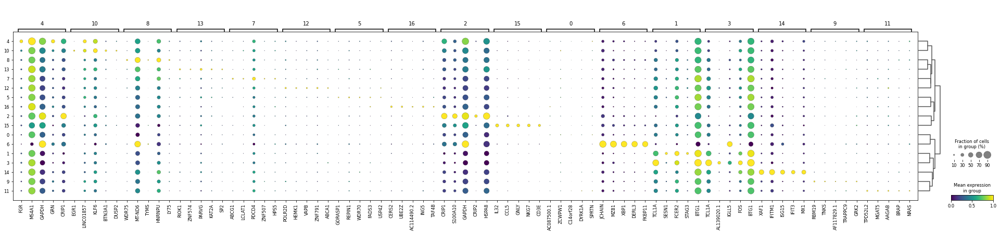

In [71]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 5, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=.58)

In [72]:
newdict = {'0':'B',
'1':'B',
'2':'B',
'3':'B',
'4':'B',
'5':'B',
'6':'Plasmablast',
'7':'B',
'8':'B',
'9':'B',
'10':'B',
'11':'B',
'12':'B',
'13':'B',
'14':'B',
'15':'doublets',
'16':'B'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [73]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['B', 'Plasmablast'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rnax.var.index:
    if re.search('^IG[HKL][VDJC]', i):
        rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [74]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [75]:
# run harmony. 
sc.external.pp.harmony_integrate(rnax, key='study_id')
# compute the neighborhood graph.
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 21:40:05,060 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 21:40:08,534 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 21:40:12,037 - harmonypy - INFO - Iteration 3 of 10
2021-01-21 21:40:14,219 - harmonypy - INFO - Iteration 4 of 10
2021-01-21 21:40:15,984 - harmonypy - INFO - Iteration 5 of 10
2021-01-21 21:40:17,594 - harmonypy - INFO - Iteration 6 of 10
2021-01-21 21:40:19,101 - harmonypy - INFO - Iteration 7 of 10
2021-01-21 21:40:20,585 - harmonypy - INFO - Iteration 8 of 10
2021-01-21 21:40:22,095 - harmonypy - INFO - Iteration 9 of 10
2021-01-21 21:40:23,547 - harmonypy - INFO - Converged after 9 iterations


In [76]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)

In [77]:
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

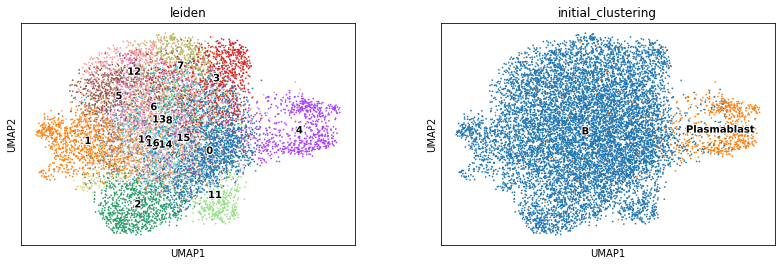

In [78]:
sc.pl.umap(rnax, color=['leiden', 'initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

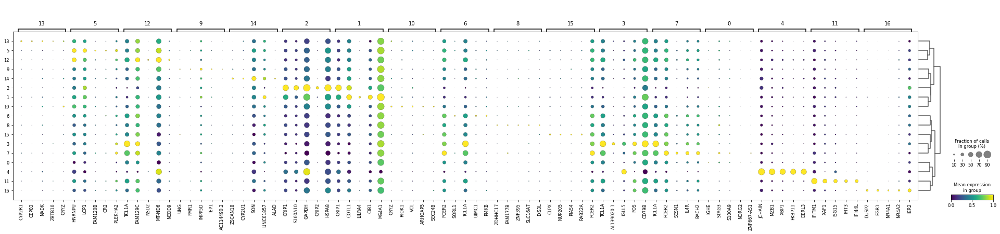

In [79]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 5, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=.58)

alright move on to the next cell type

## T cells

In [80]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['T'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rnax.var.index:
    if re.search('^TR[AB][VDJC]', i):
        rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [81]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [82]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 21:42:55,314 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 21:43:26,610 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 21:44:00,966 - harmonypy - INFO - Iteration 3 of 10
2021-01-21 21:44:35,722 - harmonypy - INFO - Iteration 4 of 10
2021-01-21 21:44:53,321 - harmonypy - INFO - Iteration 5 of 10
2021-01-21 21:45:05,150 - harmonypy - INFO - Iteration 6 of 10
2021-01-21 21:45:17,497 - harmonypy - INFO - Iteration 7 of 10
2021-01-21 21:45:29,235 - harmonypy - INFO - Iteration 8 of 10
2021-01-21 21:45:41,879 - harmonypy - INFO - Converged after 8 iterations


In [83]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

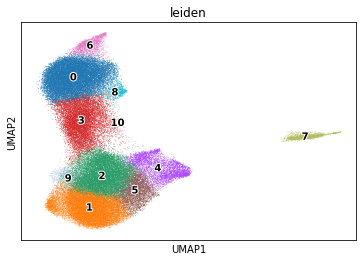

In [84]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

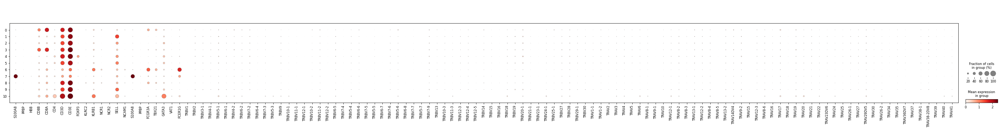

In [88]:
sc.pl.dotplot(rnax, ['S100A8', 'PPBP', 'HBB', 'CD8B', 'CD8A', 'CD4', 'CD3D', 'CD3E', 'FOXP3', 'KLRC2', 'KLRB1', 'NCR1', 'NCR2', 'SELL', 'NCAM1', 'S100A8', 'PPBP', 'FCGR3A', 'TBX21', 'GATA3', 'VAT1', 'FCER1G'] + [i for i in rna.raw.var.index if re.search('^TR[AB][V]', i)], groupby = 'leiden')

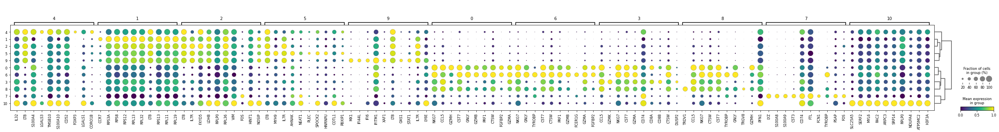

In [86]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=.58)

In [89]:
newdict = {'0':'T',
'1':'T',
'2':'T',
'3':'T',
'4':'T',
'5':'T',
'6':'NK',
'7':'doublets',
'8':'gdT',
'9':'T',
'10':'T'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [113]:
adatax = adata3[adata3.obs_names.isin(rnax.obs_names)].copy()
adatax = adatax[:, adatax.var.feature_types == 'Antibody Capture']
adatax.obs = rnax.obs.copy()
adatax.obsm = rnax.obsm.copy()
adatax.obsp = rnax.obsp.copy()

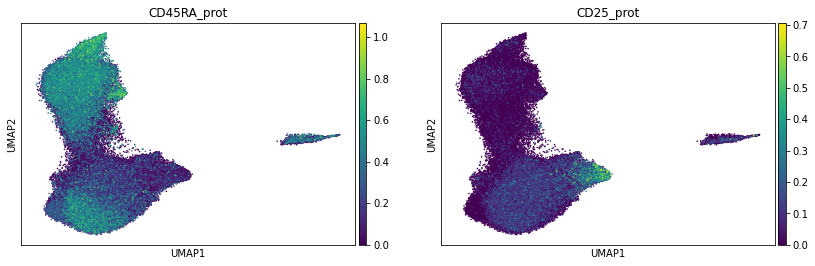

In [115]:
sc.pl.umap(adatax, color = ['CD45RA_prot', 'CD25_prot'], size = 10, vmin=0)

In [116]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['T'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rnax.var.index:
    if re.search('^TR[AB][VDJC]', i):
        rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [117]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


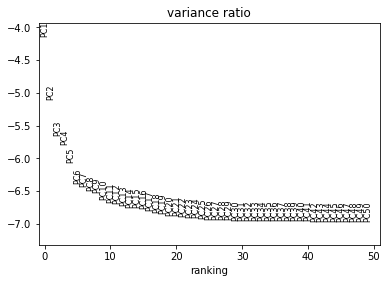

In [118]:
sc.pl.pca_variance_ratio(rnax, log = True, n_pcs = 50)

In [119]:
# run harmony. 
sc.external.pp.harmony_integrate(rnax, key='study_id')
# compute the neighborhood graph.
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 22:05:35,875 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 22:06:10,278 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 22:06:40,899 - harmonypy - INFO - Iteration 3 of 10
2021-01-21 22:07:03,494 - harmonypy - INFO - Iteration 4 of 10
2021-01-21 22:07:15,359 - harmonypy - INFO - Iteration 5 of 10
2021-01-21 22:07:27,734 - harmonypy - INFO - Converged after 5 iterations


In [120]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)

In [121]:
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

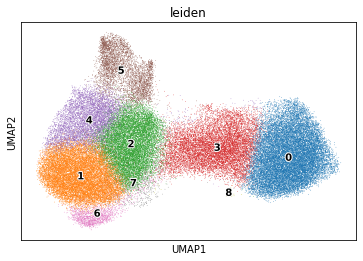

In [122]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

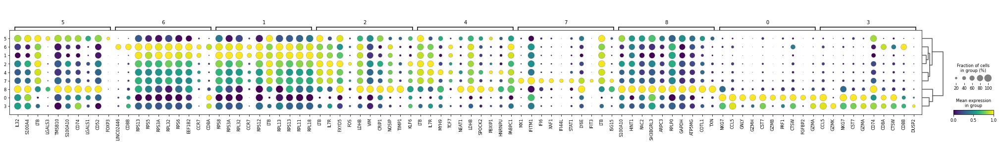

In [123]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=.58)

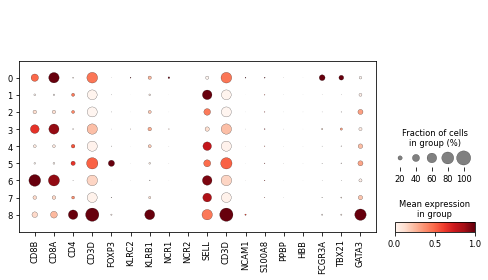

In [124]:
sc.pl.dotplot(rnax, ['CD8B', 'CD8A', 'CD4', 'CD3D', 'FOXP3', 'KLRC2', 'KLRB1', 'NCR1', 'NCR2', 'SELL', 'CD3D', 'NCAM1', 'S100A8', 'PPBP', 'HBB', 'FCGR3A', 'TBX21', 'GATA3'], groupby = 'leiden',standard_scale = 'var')

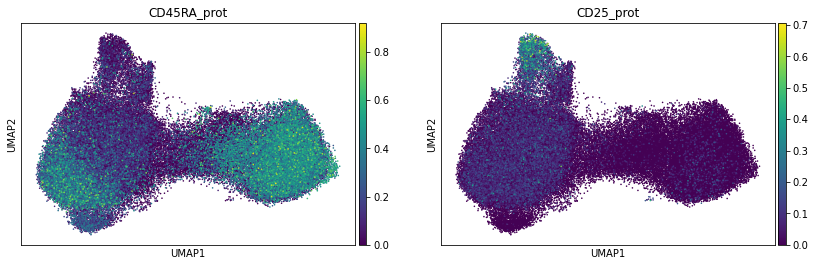

In [125]:
adatax = adata3[adata3.obs_names.isin(rnax.obs_names)].copy()
adatax = adatax[:, adatax.var.feature_types == 'Antibody Capture']
adatax.obs = rnax.obs.copy()
adatax.obsm = rnax.obsm.copy()
adatax.obsp = rnax.obsp.copy()
sc.pl.umap(adatax, color = ['CD45RA_prot', 'CD25_prot'], size = 10, vmin=0)

alright move on to the next cell type

## NK

In [126]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['NK'])].raw.to_adata().copy()
# rnax = rna[(rna.obs['leiden'].isin(['9', '2'])) | (rna.obs['initial_clustering'].isin(['NK', 'NKT']))].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^IG[HKL][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [127]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [128]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 22:13:02,854 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 22:13:14,070 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 22:13:25,338 - harmonypy - INFO - Converged after 2 iterations


In [129]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)

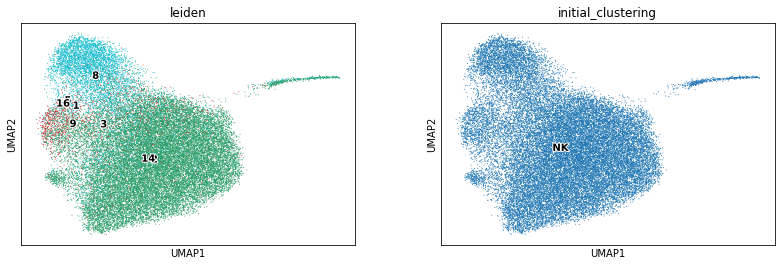

In [130]:
sc.pl.umap(rnax, color=['leiden', 'initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

In [131]:
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

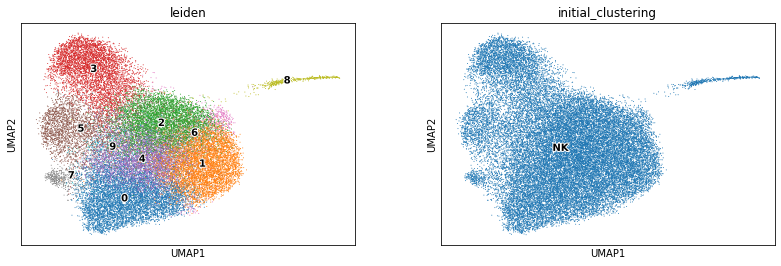

In [132]:
sc.pl.umap(rnax, color=['leiden', 'initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

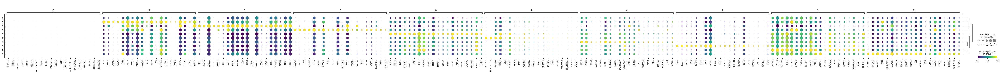

In [133]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 20, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=.58)

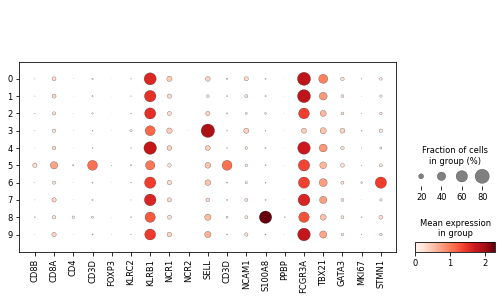

In [137]:
sc.pl.dotplot(rnax, ['CD8B', 'CD8A', 'CD4', 'CD3D', 'FOXP3', 'KLRC2', 'KLRB1', 'NCR1', 'NCR2', 'SELL', 'CD3D', 'NCAM1', 'S100A8', 'PPBP', 'FCGR3A', 'TBX21', 'GATA3', 'MKI67', 'STMN1'], groupby = 'leiden')

In [138]:
newdict = {'0':'NK',
'1':'NK',
'2':'NK',
'3':'NK',
'4':'NK',
'5':'NKT',
'6':'NK',
'7':'NK',
'8':'doublets',
'9':'NK'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [139]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['NK', 'NKT'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^IG[HKL][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [140]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


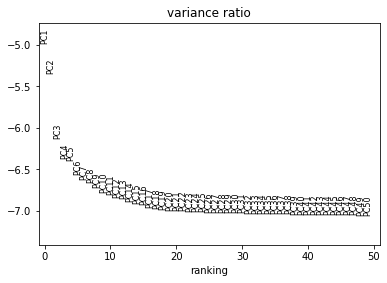

In [141]:
sc.pl.pca_variance_ratio(rnax, log = True, n_pcs = 50)

In [142]:
# run harmony. 
sc.external.pp.harmony_integrate(rnax, key='study_id')
# compute the neighborhood graph.
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 22:19:41,774 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 22:19:53,321 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 22:20:05,325 - harmonypy - INFO - Converged after 2 iterations


In [143]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)

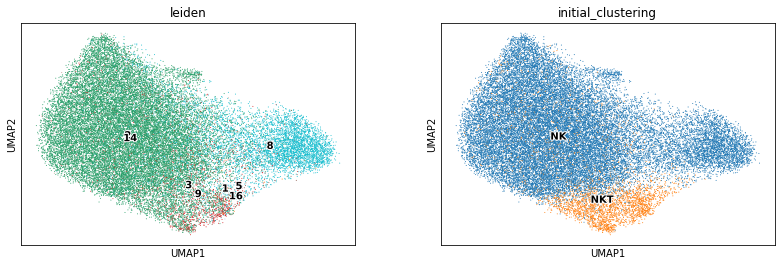

In [144]:
sc.pl.umap(rnax, color=['leiden', 'initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

In [145]:
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

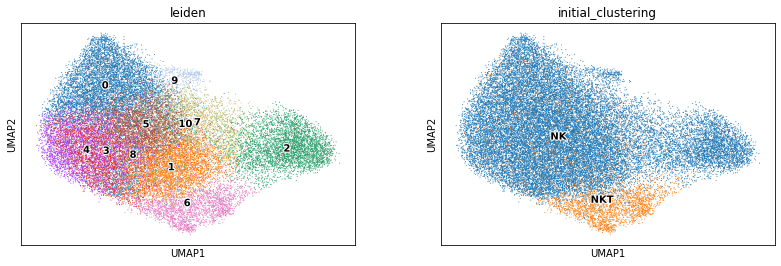

In [146]:
sc.pl.umap(rnax, color=['leiden', 'initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

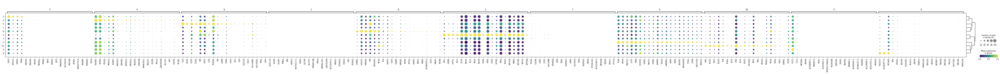

In [147]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 20, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

alright move on to the next cell type.

## gdT cells

In [148]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['gdT'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [149]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [150]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 22:22:49,213 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 22:22:50,965 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 22:22:52,723 - harmonypy - INFO - Converged after 2 iterations


In [151]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)

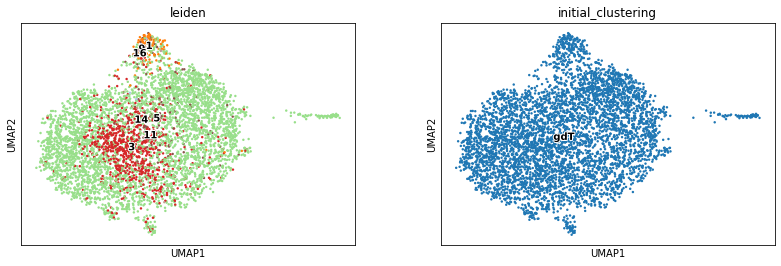

In [152]:
sc.pl.umap(rnax, color=['leiden', 'initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

In [153]:
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

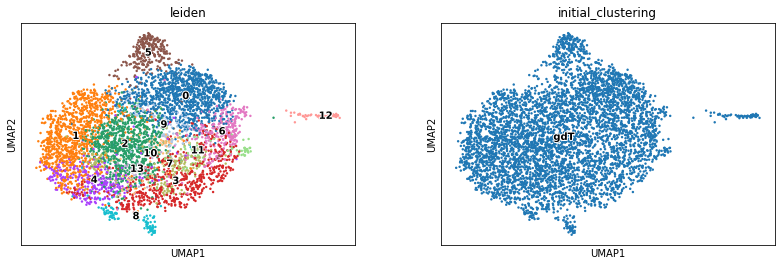

In [154]:
sc.pl.umap(rnax, color=['leiden', 'initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

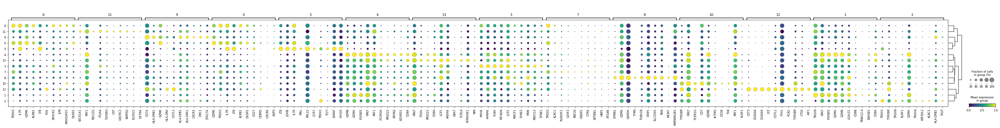

In [155]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

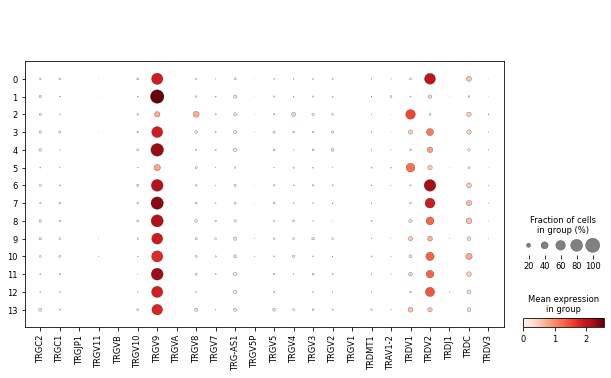

In [159]:
sc.pl.dotplot(rnax, [i for i in rnax.raw.var.index if re.search('^TR[DG]|TRAV1-2', i)], groupby = 'leiden')

In [160]:
newdict = {'0':'gdT',
'1':'gdT',
'2':'gdT',
'3':'gdT',
'4':'gdT',
'5':'gdT',
'6':'gdT',
'7':'gdT',
'8':'gdT',
'9':'gdT',
'10':'gdT',
'11':'gdT',
'12':'doublets',
'13':'gdT',}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [161]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['gdT'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
# ## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [162]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


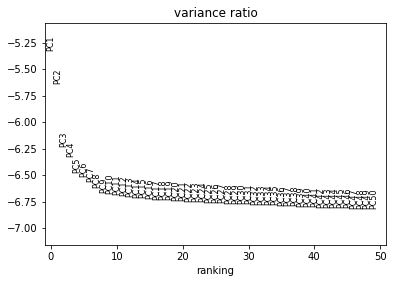

In [163]:
sc.pl.pca_variance_ratio(rnax, log = True, n_pcs = 50)

In [164]:
# run harmony. 
sc.external.pp.harmony_integrate(rnax, key='study_id')
# compute the neighborhood graph.
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 22:29:31,737 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 22:29:33,446 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 22:29:35,146 - harmonypy - INFO - Converged after 2 iterations


In [165]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)

In [166]:
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

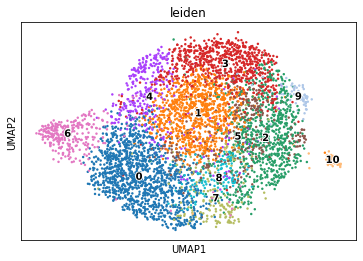

In [167]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)

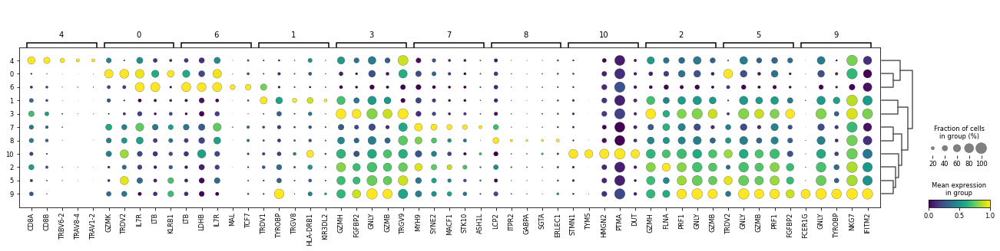

In [168]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 5, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

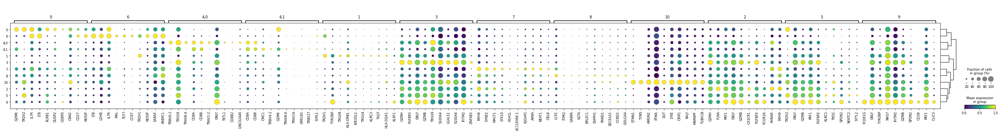

In [170]:
# find clusters
sc.tl.leiden(rnax, restrict_to = ('leiden', ['4']), resolution = 0.3, key_added = 'leiden_2')
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden_2')
sc.tl.dendrogram(rnax, groupby = 'leiden_2')
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

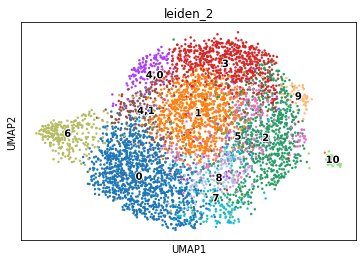

In [171]:
sc.pl.umap(rnax, color=['leiden_2'], legend_loc ='on data', legend_fontoutline=2)

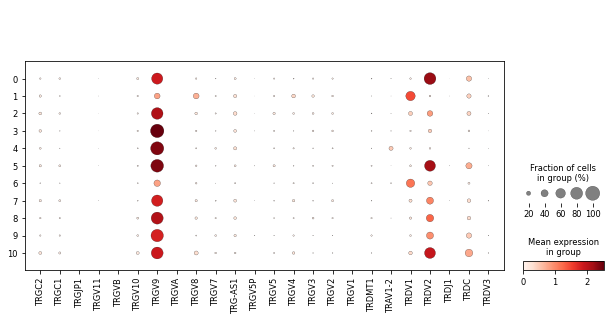

In [172]:
sc.pl.dotplot(rnax, [i for i in rnax.raw.var.index if re.search('^TR[DG]|TRAV1-2', i)], groupby = 'leiden')

In [173]:
newdict = {'0':'gdT',
'1':'gdT',
'2':'gdT',
'3':'gdT',
'4':'MAIT',
'5':'gdT',
'6':'gdT',
'7':'gdT',
'8':'gdT',
'9':'gdT',
'10':'gdT',}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

alright move on to the next cell type.

## Proliferating

In [174]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['Proliferating'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [175]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [176]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 22:39:38,062 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 22:39:40,396 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 22:39:42,691 - harmonypy - INFO - Iteration 3 of 10
2021-01-21 22:39:44,510 - harmonypy - INFO - Iteration 4 of 10
2021-01-21 22:39:46,128 - harmonypy - INFO - Iteration 5 of 10
2021-01-21 22:39:47,534 - harmonypy - INFO - Iteration 6 of 10
2021-01-21 22:39:48,855 - harmonypy - INFO - Iteration 7 of 10
2021-01-21 22:39:49,975 - harmonypy - INFO - Iteration 8 of 10
2021-01-21 22:39:51,031 - harmonypy - INFO - Iteration 9 of 10
2021-01-21 22:39:52,362 - harmonypy - INFO - Iteration 10 of 10
2021-01-21 22:39:53,505 - harmonypy - INFO - Stopped before convergence


In [177]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

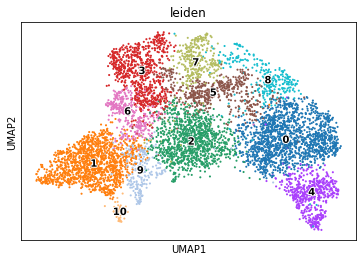

In [178]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)
# sc.pl.umap(rnax, color=['leiden'])

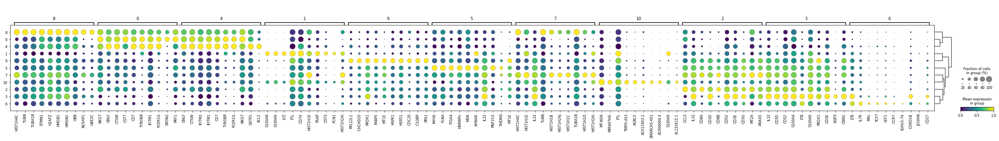

In [179]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

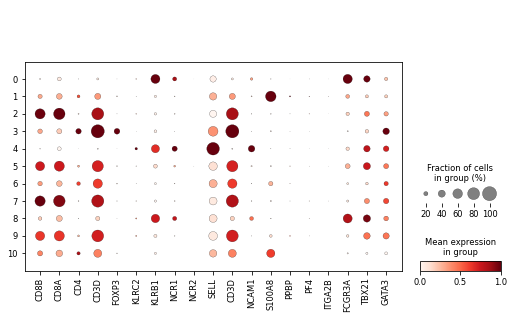

In [180]:
sc.pl.dotplot(rnax, ['CD8B', 'CD8A', 'CD4', 'CD3D', 'FOXP3', 'KLRC2', 'KLRB1', 'NCR1', 'NCR2', 'SELL', 'CD3D', 'NCAM1', 'S100A8', 'PPBP', 'PF4', 'ITGA2B', 'FCGR3A', 'TBX21', 'GATA3'], groupby = 'leiden',standard_scale = 'var')

In [181]:
newdict = {'0':'Proliferating_NK',
'1':'doublets',
'2':'Proliferating_T',
'3':'Proliferating_T',
'4':'Proliferating_NK',
'5':'Proliferating_T',
'6':'doublets',
'7':'Proliferating_T',
'8':'Proliferating_NK',
'9':'Proliferating_T',
'10':'doublets'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [190]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['Proliferating_T', 'Proliferating_NK'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [191]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [192]:
# run harmony. compute the neighborhood graph.
# sc.external.pp.harmony_integrate(rnax, key='study_id')
# sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
sc.pp.neighbors(rnax)

In [193]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

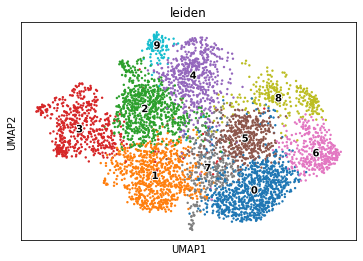

In [194]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)
# sc.pl.umap(rnax, color=['leiden'])

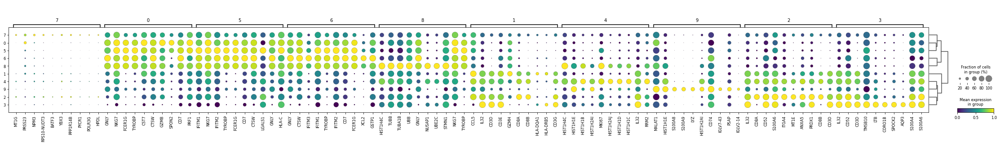

In [195]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

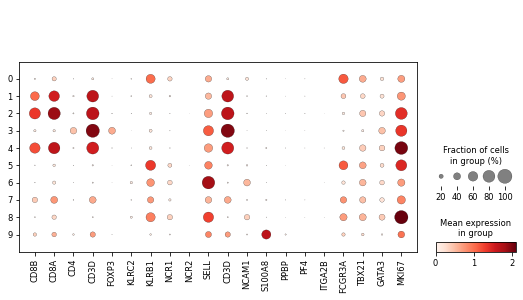

In [197]:
sc.pl.dotplot(rnax, ['CD8B', 'CD8A', 'CD4', 'CD3D', 'FOXP3', 'KLRC2', 'KLRB1', 'NCR1', 'NCR2', 'SELL', 'CD3D', 'NCAM1', 'S100A8', 'PPBP', 'PF4', 'ITGA2B', 'FCGR3A', 'TBX21', 'GATA3', 'MKI67'], groupby = 'leiden')

In [198]:
newdict = {'0':'Proliferating_lymphocyte',
'1':'Proliferating_lymphocyte',
'2':'Proliferating_lymphocyte',
'3':'Proliferating_lymphocyte',
'4':'Proliferating_lymphocyte',
'5':'Proliferating_lymphocyte',
'6':'Proliferating_lymphocyte',
'7':'Proliferating_lymphocyte',
'8':'Proliferating_lymphocyte',
'9':'doublets',}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

alright move on to the next cell type.

## T/NK

In [205]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['T/NK'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [206]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

In [207]:
# run harmony. compute the neighborhood graph.
# sc.external.pp.harmony_integrate(rnax, key='study_id')
# sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
sc.pp.neighbors(rnax)

In [208]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

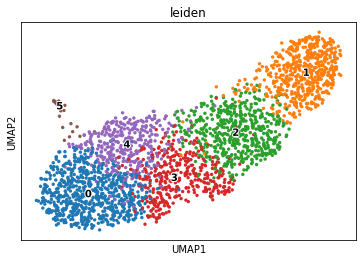

In [209]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)
# sc.pl.umap(rnax, color=['leiden'])

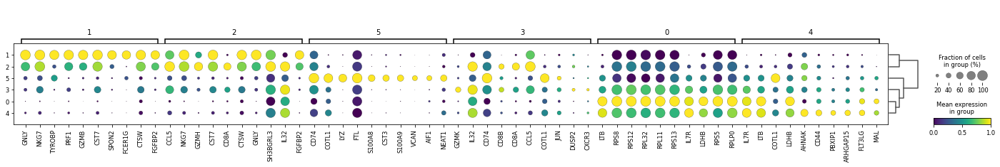

In [210]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

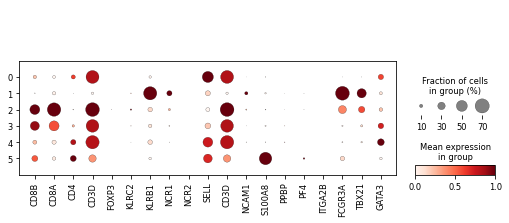

In [211]:
sc.pl.dotplot(rnax, ['CD8B', 'CD8A', 'CD4', 'CD3D', 'FOXP3', 'KLRC2', 'KLRB1', 'NCR1', 'NCR2', 'SELL', 'CD3D', 'NCAM1', 'S100A8', 'PPBP', 'PF4', 'ITGA2B', 'FCGR3A', 'TBX21', 'GATA3'], groupby = 'leiden',standard_scale = 'var')

In [212]:
newdict = {'0':'T?',
'1':'NK?',
'2':'T?',
'3':'T?',
'4':'T?',
'5':'doublets'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [220]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['NK', 'NKT', 'NK?'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
# import re
# for i in rnax.var.index:
#     if re.search('^TR[AB][VDJC]', i):
#         rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [221]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering' as categorical


In [222]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-21 22:57:46,941 - harmonypy - INFO - Iteration 1 of 10
2021-01-21 22:57:58,471 - harmonypy - INFO - Iteration 2 of 10
2021-01-21 22:58:09,879 - harmonypy - INFO - Converged after 2 iterations


In [223]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

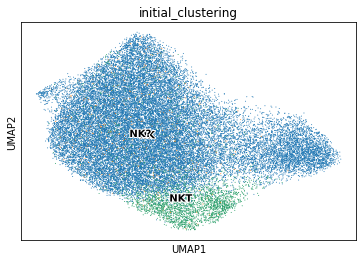

In [225]:
sc.pl.umap(rnax, color=['initial_clustering'], legend_loc ='on data', legend_fontoutline=2)

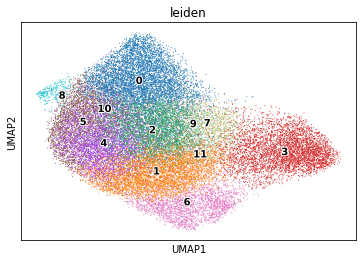

In [224]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)
# sc.pl.umap(rnax, color=['leiden'])

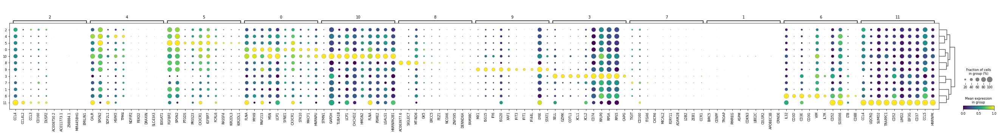

In [226]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

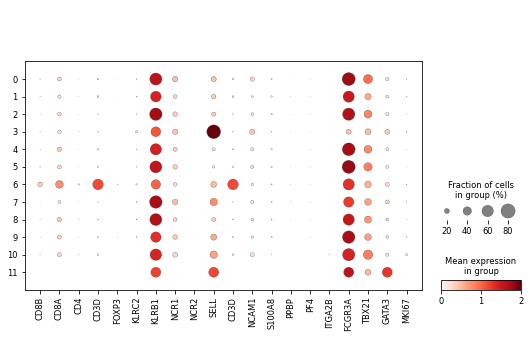

In [227]:
sc.pl.dotplot(rnax, ['CD8B', 'CD8A', 'CD4', 'CD3D', 'FOXP3', 'KLRC2', 'KLRB1', 'NCR1', 'NCR2', 'SELL', 'CD3D', 'NCAM1', 'S100A8', 'PPBP', 'PF4', 'ITGA2B', 'FCGR3A', 'TBX21', 'GATA3', 'MKI67'], groupby = 'leiden')

In [228]:
newdict = {'0':'NK',
'1':'NK',
'2':'NK',
'3':'NK',
'4':'NK',
'5':'NK',
'6':'NKT',
'7':'NK',
'8':'NK',
'9':'NK',
'10':'NK',
'11':'NK',}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

In [275]:
# clean up each major celltype
rnax = rna[rna.obs['initial_clustering'].isin(['T', 'T?'])].raw.to_adata().copy()
# Identify highly-variable genes
sc.pp.highly_variable_genes(rnax, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)
## remove TRBV/TRAV and IGHV/IGLV/IGKV from the highly variable genes
import re
for i in rnax.var.index:
    if re.search('^TR[AB][VDJC]', i):
        rnax.var.at[i, 'highly_variable'] = False
# sc.pl.highly_variable_genes(rnax)
# stash the normalized data in raw
rnax.raw = rnax
# filter to only highly variable
rnax = rnax[:, rnax.var['highly_variable']]

In [276]:
import multiprocessing
# regress and scale for PCA
sc.pp.regress_out(rnax, ['total_counts', 'pct_counts_mt'], n_jobs = multiprocessing.cpu_count()-1)
sc.pp.scale(rnax, max_value = 10)
sc.tl.pca(rnax, svd_solver = 'arpack')

In [277]:
# run harmony. compute the neighborhood graph.
sc.external.pp.harmony_integrate(rnax, key='study_id')
sc.pp.neighbors(rnax, use_rep = 'X_pca_harmony')
# sc.pp.neighbors(rnax)

2021-01-22 00:00:29,280 - harmonypy - INFO - Iteration 1 of 10
2021-01-22 00:01:03,407 - harmonypy - INFO - Iteration 2 of 10
2021-01-22 00:01:37,511 - harmonypy - INFO - Iteration 3 of 10
2021-01-22 00:02:02,137 - harmonypy - INFO - Iteration 4 of 10
2021-01-22 00:02:17,699 - harmonypy - INFO - Converged after 4 iterations


In [278]:
# run UMAP
sc.tl.umap(rnax, min_dist = 0.3)

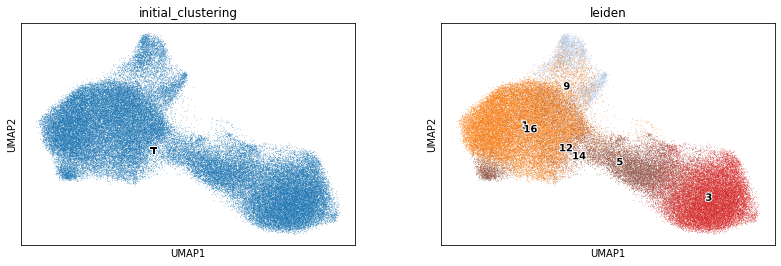

In [279]:
sc.pl.umap(rnax, color=['initial_clustering', 'leiden'], legend_loc ='on data', legend_fontoutline=2)

In [284]:
# find clusters
sc.tl.leiden(rnax)
# quick marker gene test
sc.tl.rank_genes_groups(rnax, groupby = 'leiden')

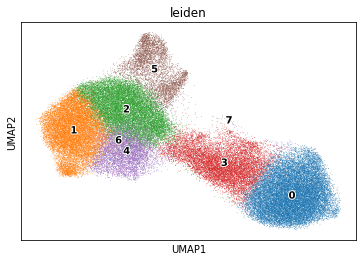

In [285]:
sc.pl.umap(rnax, color=['leiden'], legend_loc ='on data', legend_fontoutline=2)
# sc.pl.umap(rnax, color=['leiden'])

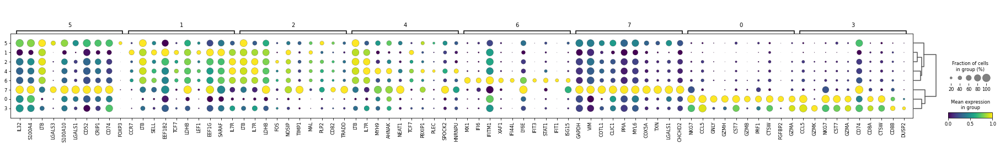

In [286]:
sc.pl.rank_genes_groups_dotplot(rnax, n_genes = 10, standard_scale = 'var', color_map = 'viridis', min_logfoldchange=1)

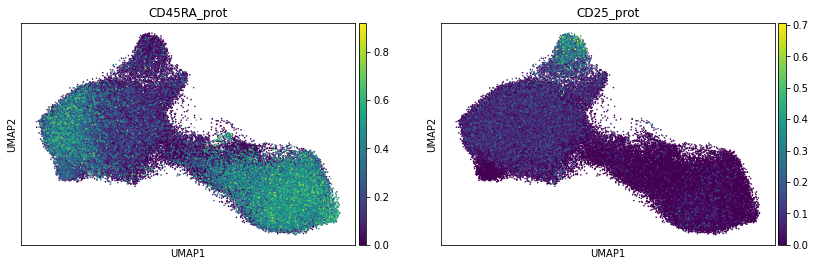

In [287]:
adatax = adata3[adata3.obs_names.isin(rnax.obs_names)].copy()
adatax = adatax[:, adatax.var.feature_types == 'Antibody Capture']
adatax.obs = rnax.obs.copy()
adatax.obsm = rnax.obsm.copy()
adatax.obsp = rnax.obsp.copy()
sc.pl.umap(adatax, color = ['CD45RA_prot', 'CD25_prot'], size = 10, vmin=0)

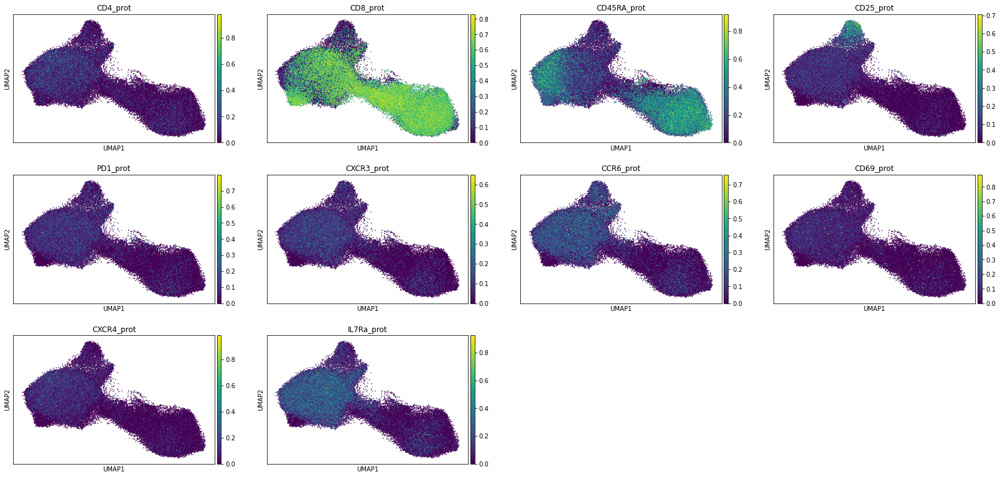

In [288]:
sc.pl.umap(adatax, color = [i for i in adatax.var.index], size = 10, vmin=0)

In [289]:
adatax2 = adata[adata.obs_names.isin(rnax.obs_names)].copy()
adatax2 = adatax2[:, adatax2.var.feature_types == 'Antibody Capture']
adatax2.obs = rnax.obs.copy()
adatax2.obsm = rnax.obsm.copy()
adatax2.obsp = rnax.obsp.copy()
def clr_normalize_each_cell(adata, inplace=True):
    """Normalize count vector for each cell, i.e. for each row of .X"""

    import numpy as np
    import scipy

    def seurat_clr(x):
        # TODO: support sparseness
        s = np.sum(np.log1p(x[x > 0]))
        exp = np.exp(s / len(x))
        return np.log1p(x / exp)

    if not inplace:
        adata = adata.copy()

    # apply to dense or sparse matrix, along axis. returns dense matrix
    adata.X = np.apply_along_axis(
        seurat_clr, 1, (adata.X.A if scipy.sparse.issparse(adata.X) else adata.X)
    )
    return adata
adatax2 = clr_normalize_each_cell(adatax2)

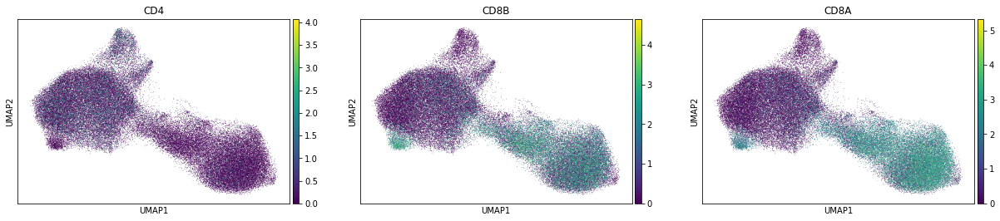

In [290]:
sc.pl.umap(rnax, color = ['CD4', 'CD8B', 'CD8A'])

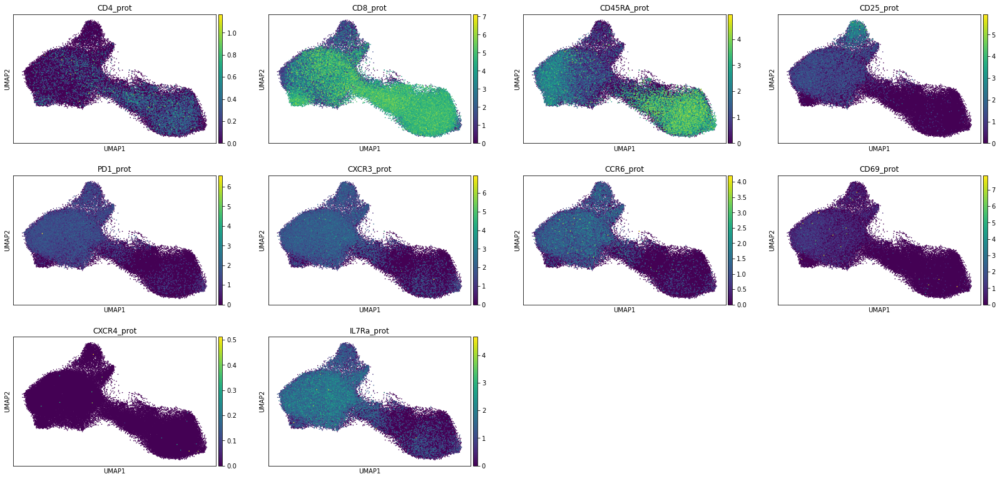

In [291]:
sc.pl.umap(adatax2, color = [i for i in adatax2.var.index], size = 10)

In [257]:
newdict = {'0':'T',
'1':'T',
'2':'T',
'3':'T',
'4':'T',
'5':'T',
'6':'T',
'7':'T'}
rnax.obs['initial_clustering'] = [newdict[l] for l in rnax.obs['leiden']]
rna.obs['initial_clustering'] = rna.obs['initial_clustering'].astype('object')
rna.obs['initial_clustering'].update(rnax.obs['initial_clustering'].astype('object'))
adata.obs = rna.obs.copy()
adata2.obs = rna.obs.copy()
adata3.obs = rna.obs.copy()

alright i think first past looks ok.

... storing 'initial_clustering' as categorical


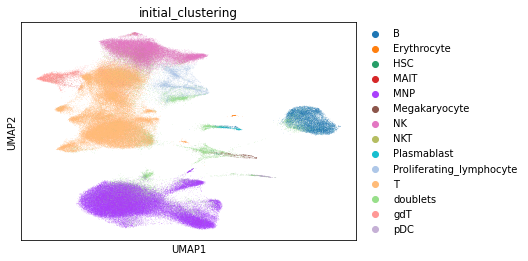

In [258]:
sc.pl.umap(rna, color = 'initial_clustering')

Trying to set attribute `.uns` of view, copying.


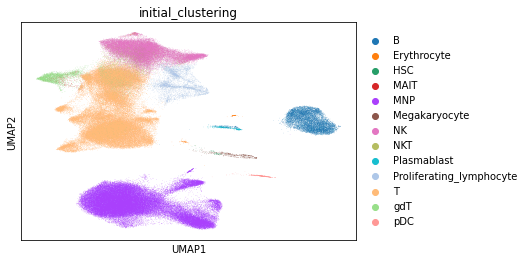

In [259]:
sc.pl.umap(rna[~(rna.obs['initial_clustering'] == 'doublets')], color = 'initial_clustering')

In [260]:
# save temporarily
rna.write('h5ad/adata_soupx_trans_cite_rna.h5ad', compression = 'gzip')
adata.write('h5ad/adata_soupx_trans_cite_raw.h5ad', compression = 'gzip')
adata2.write('h5ad/adata_soupx_trans_raw.h5ad', compression = 'gzip')
adata3.write('h5ad/adata_soupx_trans_cite_bgshift_raw.h5ad', compression = 'gzip')

... storing 'initial_clustering' as categorical
... storing 'initial_clustering' as categorical
... storing 'initial_clustering' as categorical
